<a href="https://colab.research.google.com/github/novay/amikom/blob/main/cv4_features.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **RTM-4**<br/>
**Topik : "Feature, Finding Corner and Invariance"**<br/><br/>

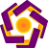

### **Universitas Amikom Yogyakarta**<br/> 
**Program Studi PJJ S2 Teknik Informatika**<br/>

Mata Kuliah : **Computer Vision (CV)**<br/>
Dosen Pengampu : **Dr. Arief Setyanto, S.Si., M.T.**<br/>
Tutor : **Rizqi Sukma Kharisma, M.Kom.**

### **A. Pendahuluan**<br/>
Laporan ini merupakan hasil *review* dari perkuliahan yang dilakukan pada pertemuan ke-6 (Enam) bersama Bapak **Rizqi Sukma Kharisma, M.Kom.** dan dilaksanakan pada tanggal 29 Maret 2023.

#### **1. Identitas Mahasiswa**<br/>
* Nama : **Novianto Rahmadi**
* NIM : **22.55.2293**
* Konsentrasi : **Business Intelligence**
* Tugas Ke : **3 (Tiga)**

#### **2. Environment**<br/>
Dalam melakukan uji coba syntax pada tugas ini, saya menggunakan beberapa tools dan perangkat berikut:
- Macbook Pro M1 Pro
- Visual Studio Code with Python 3.11
- Google Chrome 107.0.5304.110
- Google Colab with Python 3.9

#### **3. Library Python**<br/>
Dan sebagai penunjang dalam implementasinya, sesuai arahan yang ada dalam materi saya menggunakan beberapa library diantaranya:
- **Numpy** - untuk melakukan operasi matematika pada array dan matriks
- **Pandas** - untuk manipulasi dan analisis data
- **OpenCV** - untuk pemrosesan citra dan visi komputer
- **Matplotlib** - untuk visualisasi data secara grafis

In [182]:
# %pip install opencv-python numpy matplotlib pandas
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

#### **4. Persiapan Asset**<br/>
Sebelum melanjutkan *review* terkait beberapa tema berikut, saya akan coba untuk mempersiapkan beberapa *asset* berupa citra dan video yang akan digunakan dalam laporan ini, yaitu sebagai berikut:

**Hint :**<br/>
Anda bisa menjalankan perintah berikut untuk mempersiapkan *assets* yang akan digunakan sepanjang tugas laporan ini. Proses ini akan membantu Anda untuk mengunduh semua *asset* ke dalam **Files Storage** Google Colab Anda.

In [ ]:
!wget -O chess-pattern.png https://raw.githubusercontent.com/novay/amikom/main/assets/chess-pattern.png
!wget -O klo1.jpg https://raw.githubusercontent.com/novay/amikom/main/assets/klo1.jpg
!wget -O klo2.jpg https://raw.githubusercontent.com/novay/amikom/main/assets/klo2.jpg
!wget -O kucing.mp4 https://github.com/novay/amikom/raw/main/assets/kucing.mp4

# INIT VERIABLE (MANDATORY!)
chess = "chess-pattern.png"
gedung1 = "klo1.jpg"
gedung2 = "klo2.jpg"
video = "kucing.mp4"

Adapun file-file yang disiapkan untuk project ini diantaranya:<br/>
- **chess-pattern.png** (gambar pola papan catur)
- **klo1.jpg** dan **klo2.jpg** (gambar random)
- **kucing.mp4** (video durasi pendek)

Berikut variabel dari asset-asset tersebut (secara terurut) yang bisa digunakan adalah **`chess`**, **`gedung1`**, **`gedung2`** dan **`video`**.

### **B. Image Section**<br/>
Sesi ini hanya berfokus pada contoh implementasi terhadap gambar atau citra. Lebih spesifiknya, saya akan menjelaskan terkait cara menggunakan **Corner Image Detection** dan langkah-langkah dalam melakukan **Image Stitching** (Panorama).

#### **1. Corner Detection**<br/>
Corner detection adalah teknik dalam computer vision yang digunakan untuk menemukan sudut atau titik di gambar yang memiliki perbedaan intensitas signifikan di beberapa arah. Titik sudut ini kemudian dapat digunakan sebagai fitur dalam berbagai aplikasi seperti pemrosesan gambar, pengenalan objek, pelacakan gerakan, dan navigasi robot.



##### **a) Harris Corners**<br/>
Cara kerja teknik ini adalah dengan menghitung perbedaan intensitas cahaya di sekitar suatu titik pada citra, dan kemudian menghitung nilai eigenvalue dari matriks auto-korelasi pada setiap titik. Jika nilai eigenvalue-nya melebihi ambang batas tertentu, maka titik tersebut dianggap sebagai sudut.

Adapun untuk memanfaatkan fungsi dari Harris Corners ini adalah dengan menggunakan `cv2.cornerHarris()` yang disiapkan oleh OpenCV. Untuk atribut atau parameter yang dibutuhkan adalah sebagai berikut: 

**cv2.cornerHarris(img, blockSize, kSize, k)**

- **img** - gambar grayscale yang akan dianalisis
- **blockSize** - ukuran blok yang akan digunakan untuk perhitungan corner response (biasanya antara 2-7)
- **kSize** - ukuran kernel sobel yang akan digunakan untuk perhitungan gradient citra (biasanya 3)
- **k** - konstanta yang digunakan dalam persamaan perhitungan corner response, biasanya berkisar antara 0,04-0,06<br/><br/>

**Catatan:**<br/>
Penjelasan setiap baris perintahnya akan saya jabarkan pada setiap barisnya.

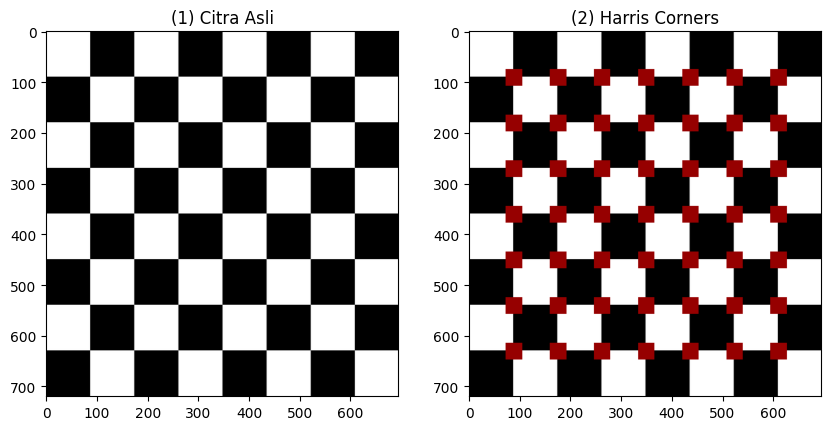

In [184]:
corner_img = cv2.imread(chess) # Siapkan citra asli (sebagai pembanding)

cornered_img = cv2.imread(chess) # Siapkan citra yang ingin di-"harrisisasi"
corner_gray_img = cv2.cvtColor(cornered_img, cv2.COLOR_BGR2GRAY) # Konversi ke format Grayscale (Wajib)

"""
  Terapkan algoritma Harris Corner, dimana:
  - corner_gray_img : citra grayscale
  - 3 : ukuran blok kernel yang digunakan untuk operasi konvolusi pada proses deteksi sudut (dalam hal ini 3x3)
  - 5 : aperture parameter dari operator sobel yang digunakan pada proses deteksi sudut (harus ganjil dan tidak boleh lebih dari 31)
  - 0.05 : untuk menentukan sensitivitas deteksi sudut. Semakin kecil, semakin banyak sudut yang terdeteksi (umumnya 0.04 s/d 0.06)
"""
corner_dst = cv2.cornerHarris(corner_gray_img, 3, 5, 0.05) 

kernel = np.ones((10, 10), np.uint8) # Siapkan kernel berukuran 10x10
corner_dst = cv2.dilate(corner_dst, kernel, iterations = 3) # Lakukan proses dilasi berdasarkan kernel dengan proses sebanyak 3 kali

"""
  Tempel sudut-sudut yang yang ditemukan kedalam citra, dengan aturan:
  - corner_dst > 0.01 * corner_dst.max() membentuk pixels disetiap sudut
  - [150, 0, 0] berwarna biru (Notasi BGR)
"""
cornered_img[corner_dst > 0.01 * corner_dst.max()] = [150, 0, 0] # G

""" Tampilkan perbandingan citra-citranya """
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1); plt.imshow(corner_img); plt.title("(1) Citra Asli")
fig.add_subplot(1, 2, 2); plt.imshow(cornered_img); plt.title("(2) Harris Corners")
fig.show()

Seperti yang terlihat, citra **(1) Citra Asli** memang ditampilkan apa adanya sebagai pembanding, sementara citra **(2) Harris Corners** sudah dilakukan manipulasi dengan menimpa pixels baru disudut-sudut yang terdeteksi oleh fungsi **Harris Corners**. 

##### **b) Shitomasi Detection**<br/>
Shitomasi adalah algoritma deteksi fitur atau sudut pada citra yang berkerja dengan cara mencari titik-titik di citra yang stabil dalam pergeseran dan rotasi gambar, sehingga dapat digunakan untuk pelacakan objek atau pemetaan fitur antar gambar.<br/>

Dikatakan bahwa Shitomasi dikembangkan untuk menutupi kekurangan dari Harris Corner, dengan kata lain seharusnya algoritma ini bisa lebih baik dan lebih akurat dari algoritma pendahulunya.

Fungsi ini digunakan dengan perintah **goodFeaturesToTrack()** milik OpenCV. Untuk parameternya diantaranya: 

**cv2.goodFeaturesToTrack(img, 200, 0.1, 5)**

- **img** - gambar grayscale yang akan dianalisis
- **200** - jumlah maksimum titik sudut yang ingin dideteksi
- **0.1** - kualitas identifikasi terhadap intensitas perubahan piksels (biasanya 0,01 s/d 0,1)
- **5** - jarak minimum antara dua titik sudut yang terdeteksi (piksels)


Jumlah Titik Terdeteksi = 49



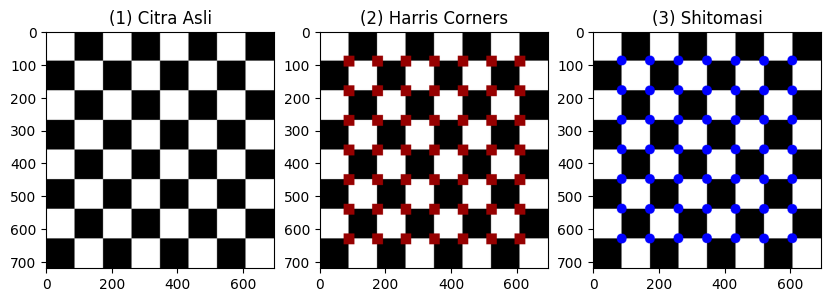

In [185]:
""" Siapkan citra untuk Shitomasi """
cornered_img2 = cv2.imread(chess)
cornered_gray_img2 = cv2.cvtColor(corner_img, cv2.COLOR_BGR2GRAY) # Konversi ke Grayscale

""" 
  Deteksi sudut-sudut pada gambar grayscale. Berikut parameternya:
  - corner_gray - gambar grayscale
  - 200 - jumlah titik sudut yang ingin dideteksi
  - 0.1 - quality level yang digunakan untuk menentukan kualitas sudut
  - 15 - jarak minimum antara titik sudut yang dideteksi
"""
sudut = cv2.goodFeaturesToTrack(cornered_gray_img2, 200, 0.1, 15)

""" Konversi array setiap sudut ke integer """
sudut = np.int0(sudut) 

""" 
  Looping semua titik sambil:
  - ravel() - menempatkan titik lokasi sudut yang terdeteksi ke variabel x dan y
  - cv2.circle() - menggambar lingkaran pada citra dengan parameter:
    - "(x, y)" - titik pusat pada koordinat (x, y)
    - "15" - radius lingkaran
    - "(0, 0, 255)" - warna merah (RGB)
    - "-1" - sebar (fill) warna keseluruh pixel, selain -1 akan menjadi garis
"""
for i in sudut:
  x, y = i.ravel()
  cv2.circle(cornered_img2, (x, y), 15, (0, 0, 255), -1)

""" Tampilkan perbandingan citra-citranya """
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 3, 1); plt.imshow(corner_img); plt.title("(1) Citra Asli")
fig.add_subplot(1, 3, 2); plt.imshow(cornered_img); plt.title("(2) Harris Corners")
fig.add_subplot(1, 3, 3); plt.imshow(cornered_img2); plt.title("(3) Shitomasi")
fig.show()

""" Tampilkan jumlah titik yang terdeteksi """
print("\nJumlah Titik Terdeteksi = " + str(sudut.shape[0]) + "\n")

Seperti yang dilihat, sebenarnya tidak ada perbedaan khusus antara penggunaan Harris dan Shitomasi pada citra ini, karena pola yang disajikan sangat sederhana, namun akan berbeda apabila menggunakan citra yang kompleks.

#### **2. Image Stitching**<br/>
Image stitching adalah proses penggabungan beberapa gambar dengan tumpang tindih bagian yang saling terkait untuk membentuk satu gambar panorama yang utuh. Proses ini dilakukan dengan menggunakan teknik komputasi penglihatan komputer dan pemrosesan gambar untuk menghilangkan tumpang tindih antar gambar, mengatur perspektif dan blending untuk membuat gambar panorama yang tampak mulus dan konsisten.

##### **a) Persiapan citra**<br/>
Tahap ini mempersiapkan 2 citra yang ingin digabungkan. Pastikan citra yang ingin di stitching memiliki kemiripan dan jangan sampai susunan gambarnya terbalik bila tidak ingin ada masalah di hasilnya.

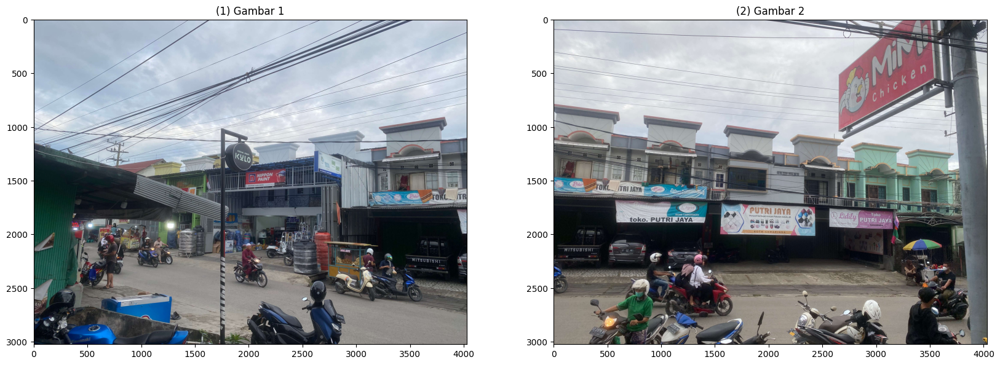

In [187]:
""" 
  Siapkan 2 citra yang ingin dikombinasikan, dengan:
  - Baca gambar
  - Konversi ke format RGB
"""
img = cv2.imread(gedung1)
rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

img2 = cv2.imread(gedung2)
rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

""" Tampilkan citra-citranya """
fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1, 2, 1); plt.imshow(rgb); plt.title("(1) Gambar 1")
fig.add_subplot(1, 2, 2); plt.imshow(rgb2); plt.title("(2) Gambar 2")
fig.show()

##### **b) Deteksi Keypoint**<br/>
Pada tahap ini, kita akan mendeteksi fitur atau ciri khas pada kedua gambar.

###### **Jumlah Titik**<br/>
Temukan jumlah titik atau keypoint dari kedua gambar.

In [188]:
""" Resize ukuran gambar """
skala = 0.25
imrz = cv2.resize(img, (0, 0), fx=skala, fy=skala)
imrz2 = cv2.resize(img2, (0, 0), fx=skala, fy=skala)

""" 
  Konversi kedua gambar masing-masing ke:
  - dari BGR ke RGB
  - dan RGB ke Grayscale
"""
rgb  = cv2.cvtColor(imrz, cv2.COLOR_BGR2RGB)
rgb2 = cv2.cvtColor(imrz2, cv2.COLOR_BGR2RGB)

abu  = cv2.cvtColor(rgb, cv2.COLOR_BGR2GRAY)
abu2 = cv2.cvtColor(rgb2, cv2.COLOR_BGR2GRAY)

""" Melakukan ekstraksi fitur menggunakan algoritma SIFT (Scale-Invariant Feature Transform) """
sift = cv2.xfeatures2d.SIFT_create()
kp, des = sift.detectAndCompute(abu, None)
kp2, des2 = sift.detectAndCompute(abu2, None)

""" Tampilkan jumlah titik yang terdeteksi """
df = pd.DataFrame({'Jumlah Titik Terdeteksi': [len(kp), len(kp2)]})
df.index = ['Gambar 1', 'Gambar 2']

display(df)

,Jumlah Titik Terdeteksi
Gambar 1,3185
Gambar 2,3350


###### **Output Citra**
Setelah semua keypoint berhasil identifikasii, selanjutnya timpakan gambar titik-titik tersebut kedalam citra kemudian tampilkan.

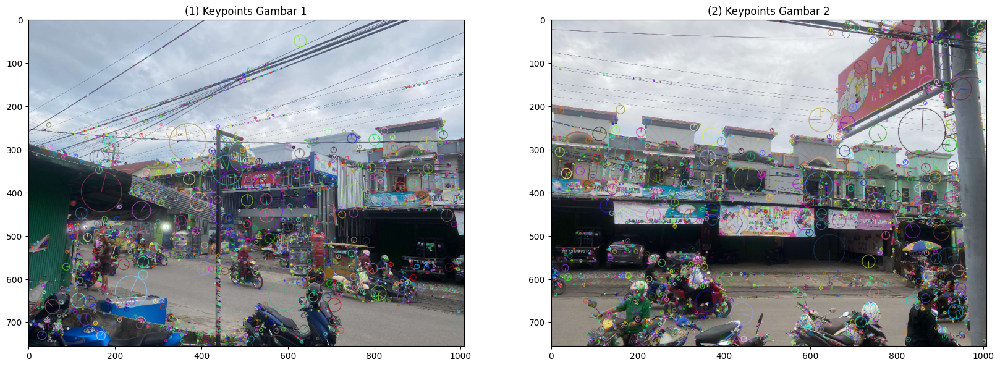

In [189]:
""" Menggambar Keypoint yang berhasil diidentifikasi """
img3 = cv2.drawKeypoints(rgb, kp, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4 = cv2.drawKeypoints(rgb2, kp2, None, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

""" Tampilkan dengan plot """
fig = plt.figure(figsize=(20, 15))
fig.add_subplot(1, 2, 1); plt.imshow(img3); plt.title("(1) Keypoints Gambar 1")
fig.add_subplot(1, 2, 2); plt.imshow(img4); plt.title("(2) Keypoints Gambar 2")
fig.show()

##### **c) Matching**<br/>
Melakukan Matching dari Hasil deteksi Keypoints menggunakan BruteForce Matcher

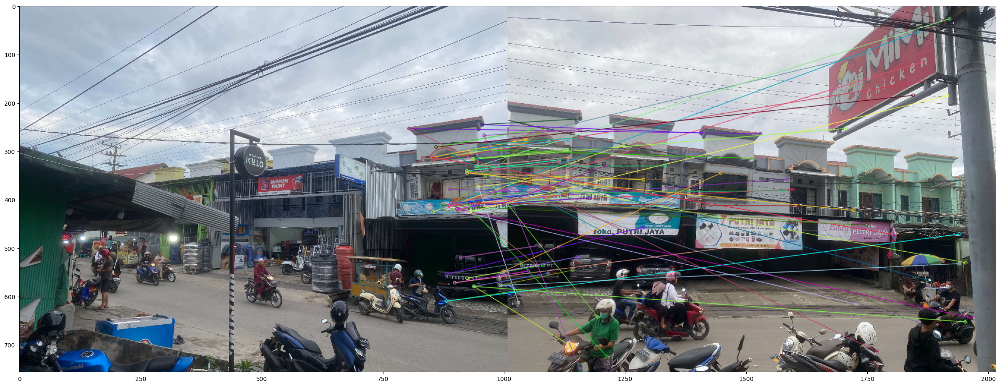

In [190]:
""" 
  Melakukan feature matching menggunakan Brute-Force Matcher (BFMatcher)
  - Buat objek bf dengan menggunakan cv2.BFMatcher()
  - Cocokkan descriptor pada kedua gambar dengan menggunakan .knnMatch(des, des2, k=2), dimana 
    - des adalah deskriptor gambar 1
    - des2 adalah deskriptor gambar 2
    - k=2 mengembalikan 2 nearest neighbours (NN) untuk setiap keypoint
"""
bf = cv2.BFMatcher()
matches = bf.knnMatch(des, des2, k=2)

""" 
  Uji Rasio Matching 
  - Siapkan variabel array untuk menampung pasangan yang memiliki kedekatan
  - Jalankan uji rasio pencocokan berdasarkan kedekatan, dimana
    - Rasio dihitung berdasarkan jarak Euclidean dari pasangan fitur terdekat (m[0]) dengan pasangan fitur terdekat kedua (m[1])
    - Jika rasio lebih kecil dari 0.5, maka pasangan fitur tersebut dianggap sebagai "BERJODOH"
    - Kemudian disimpan kedalam list Pasangan
"""
list_pasangan = [] 
for m in matches: 
  if m[0].distance/m[1].distance < 0.5:
    list_pasangan.append(m)

""" Simpan nilai pertama dari setiap pasangan yang "BERJODOH" dalam bentuk array """
good_match_arr = np.asarray(list_pasangan)[:,0]

""" Gambarkan hasil pencocokan fitur antara dua gambar menggunakan algoritma k-NN (k-Nearest Neighbor) """
im_matches = cv2.drawMatchesKnn(rgb, kp, rgb2, kp2, list_pasangan[0:60], None, flags=2)

""" Tampilkan dengan plot """
plt.figure(figsize=(30, 30))
plt.imshow(im_matches)
plt.show()

##### **d) Penggabungan**<br/>
Setelah proses matching, terakhir cukup menggabungkan kedua gambar berdasarkan titik-titik keypoint yang sudah dicocokkan. Kode berikut akan menggabungkan kedua gambar dengan menggunakan transformasi homografi.

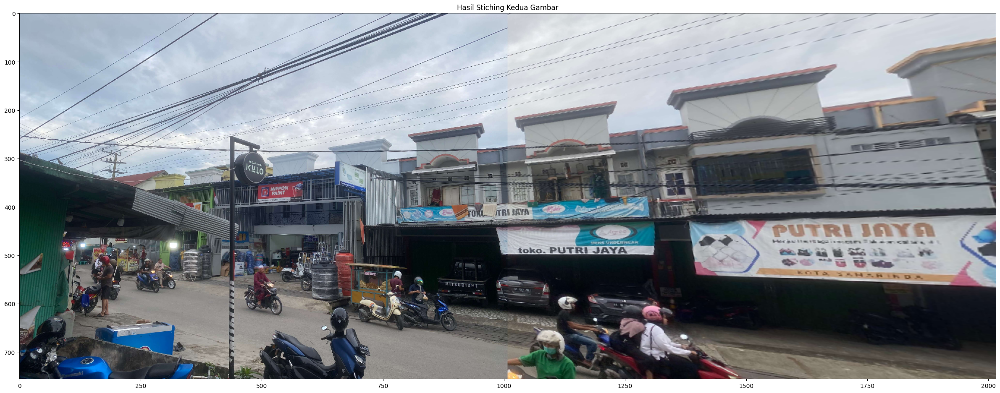

In [191]:
""" Buat array yang berisi titik-titik kunci yang cocok antara kedua gambar """
good_kp = np.array([kp[m.queryIdx].pt for m in good_match_arr])
good_kp2 = np.array([kp2[m.trainIdx].pt for m in good_match_arr])

""" 
  Hitung matriks homografi antara kedua gambar, dimana:
  - good_kp2 dan good_kp: array yang berisi titik kunci yang cocok pada kedua gambar
  - cv2.RANSAC: algoritma pencocokan model yang digunakan untuk menentukan set titik kunci yang konsisten dengan model homografi
  - 5.0: nilai threshold yang digunakan oleh algoritma RANSAC untuk memisahkan titik kunci yang cocok dengan yang tidak cocok

  Fungsi ini akan mengembalikan matriks homografi 'H' dan sebuah mask 'masked'
"""
H, masked = cv2.findHomography(good_kp2, good_kp, cv2.RANSAC, 5.0)

""" 
  Memindahkan gambar kedua ('rgb2') ke dalam koordinat gambar pertama ('rgb') menggunakan matriks homografi 'H'
  - rgb2: gambar kedua yang akan dipindahkan
  - H: matriks homografi yang digunakan untuk memindahkan gambar kedua ke koordinat gambar pertama
  - (rgb.shape[1] + rgb2.shape[1], rgb.shape[0]): ukuran gambar hasil yang diinginkan. Ukuran gambar hasil adalah gabungan antara lebar gambar pertama dan gambar kedua, dan tinggi gambar pertama.
"""
rgb_r_warped = cv2.warpPerspective(rgb2, H, (rgb.shape[1] + rgb2.shape[1], rgb.shape[0]))

"""  Menggabungkan gambar hasil yang sudah dipindahkan (rgb_r_warped) dengan gambar pertama (rgb) """
rgb_r_warped[0:rgb.shape[0], 0:rgb.shape[1]] = rgb 

""" Tampilkan dengan plot """
plt.figure(figsize=(30, 30))
plt.imshow(rgb_r_warped)
plt.title('Hasil Stiching Kedua Gambar')
plt.show()

Hasilnya tidak terlalu OK tapi OK-lah. Mungkin bisa menggunakan 2 citra yang lebih tenang dan tidak terganggu dengan pergerakan kendaraan seperti pada foto yang saya ambil secara acak ditempat yang juga acak.

### **C. Video Section**<br/>
Pada bagian ini berfokus pada pembahasan dalam pengolahan data berupa video atau gambar bergerak termasuk di dalamnya pemanfaatan kamera atau webcam. Dalam perkuliahan, tahapan ini masih sekedar review singkat terkait sesi ini. Meski begitu saya akan coba melakukan uji coba pada bahan yang diberikan dari sesi perkuliahan.

**PROBLEM:**<br/>
Sayangnya untuk melakukan processing pada data video, Google Colab masih sangat terbatas. Fakta bahwa environment yang kita gunakan bersifat daring memberikan keterbatasan dalam mengakses sisi hardware kita khususnya kamera.

**SOLUSI LAPORAN:**<br/>
Untuk itu, dalam file Colab ini, saya hanya akan melampirkan source code beserta penjelasan terkait pemanfaatan manipulasi video. Untuk laporan, hasil  tangkapan layar dan uji cobanya akan saya sertakan pada file dokumen yang dikumpulkan bersamaan dengan laporan ini.

#### **1. Working with Video**<br/>
Sebelum lebih lanjut ke arah manipulasi video, saya perlu mengetahui bagaimana cara mengelola video menggunakan library OpenCV. Sayangnya seperti tadi, beberapa syntax dibawah akan saya **skip** dan hanya bisa di running di environment masing-masing.

Baris | Keterangan
--- | --- 
**Line 1** | Variabel untuk menampung kondisi perintah tanpa harus menjalankan lanjutannya

In [48]:
skip_code = True

Baris | Keterangan
--- | --- 
**Line 3** | Import library yang dibutuhkan
**Line 5** | Baca file video dan tampung dalam variabel. Variabel dalam `cv2.VideoCapture(video)` yang digunakan adalah file `.mp4` yang diunduh pada tahap **4. Persiapan Asset**.
**Line 6** | Menyiapkan sebuah **window** dengan judul **Video** dengan ukuran **WINDOW_NORMAL** atau sesuai ukuran video aslinya.
**Line 8-18** | Bisa dikatakan sebagai proses rendering atau buffer video, adapun pola prosesnya adalah sebagai berikut:
| - Line 9 : Membaca file video
| - Line 10 : Buat kondisi dimana selama kondisi belum terpenuhi maka lakukan tahapan selanjutnya
| - Line 11 : Konversi video menjadi Grayscale
| - Line 13 : Rekam frame dan masukkan kedalam Video
| - Line 15 : Buat kondisi dan terus lakukan selama 25 detik
**Line 19-20** | Tutup window video beserta window-window lainnya yang dibuka oleh python kita

In [51]:
if not skip_code:
  # START CODE ===
  import cv2

  video = cv2.VideoCapture(video)
  cv2.namedWindow('Video', cv2.WINDOW_NORMAL)

  while(video.isOpened()):
      ret, frame = video.read()
      if ret == True:
          gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

          cv2.imshow('Video', gray)

          if cv2.waitKey(25) & 0xFF == ord('q'):
              break
      else:
          break
  video.release()
  cv2.destroyAllWindows()
  # END CODE ===
else:
  print("NOTE: Mohon jalankan menggunakan VSCode atau PyCharm.")

NOTE: Mohon jalankan menggunakan VSCode atau PyCharm.


Sebenarnya bila kita logikakan, Google Colab bisa di-tweak untuk menggunakan hardware dari sisi penggunanya dengan memanfaatkan perantara Browser.  Maksudnya, dengan memanipulasi bahasa program yang bisa di baca oleh Browser (dalam hal ini adalah HTML), salah satu contohnya adalah perintah kode berikut:

In [52]:
from IPython.display import HTML
from base64 import b64encode

mp4 = open(video, 'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

play = HTML("""
<video width='500' controls autoplay loop>
      <source src='%s' type='video/mp4'>
</video>
""" % data_url)  

display(play)

Dengan kata lain, seharusnya kita bisa menggunakan webcam selama browser yang kita gunakan diberikan izin untuk menggunakan webcam atau kamera. Hanya saja, terlalu merepotkan apabila pola ini digunakan untuk melakukan editing video, dan pastinya akan banyak fitur yang terbatas penggunaannya.

#### **2. Corner Harris Camera**<br/>
Langsung lanjut ke review pembahasannya, pada poin ini saya akan sedikit melakukan review terhadap cara implementasi algoritma **Harris Corner** di dalam citra bergerak atau video.

Pada prinsipnya, pola kerjanya hanya mengeksekusi fungsi dari algoritma ini terus menerus *(frame by frame)*. Jadi seharusnya tidak perlu diberikan penjelasan lebih lanjut.

In [53]:
if not skip_code:
  # START CODE ===
  """ Import pustaka yang dibutuhkan """
  import cv2
  import numpy as np

  """ 
    Akses citra atau video, bisa melalui file atau kamera
    - parameter bisa berupa path file atau bernilai integer yang merepresentasikan 
      device yang terhubung dengan perangkat kita, dalam kasus ini saya:
      - Nilai 0 akan menjalankan WebCam
      - Nilai 1 akan menjalankan kamera dari iPhone
  """
  cam = cv2.VideoCapture(0)

  """ Mengatur ukuran frame (width & height) """
  cam.set(3, 640)
  cam.set(4, 480)

  """ menjalankan video (frame by frame) sampai kondisi tertentu terpenuhi"""
  while True:
    """ membaca video """
    retV, frame = cam.read()
    """ konversi frame menjadi Grayscale """
    abu = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    """ konversi citra grayscale menjadi tipe float """
    abu = np.float32(abu)
    """ menjalankan fungsi algoritma Harris """
    dst = cv2.cornerHarris(abu, 6, 21, 0.1)
    """ menerapkan kernel kedalam citra dengan matriks 3x3 (None) """
    dst = cv2.dilate(dst, None)

    """ proses pembentukan objek dengan warna [0,0,255] atau biru """
    frame[dst > 0.09 * dst.max()] = [0, 0, 255]

    """ menampilkan objek kedalam frame """
    cv2.imshow("layar", frame)

    """ lakukan perulangan sampai waktu video habis """
    if cv2.waitKey(1) & 0xFF == ord('q'):
      break

  """ tutup semua figure atau window yang terbuka """
  cam.release()
  cv2.destroyAllWindows()
  # END CODE ===
else:
  print("NOTE: Mohon jalankan menggunakan VSCode atau PyCharm.")

NOTE: Mohon jalankan menggunakan VSCode atau PyCharm.


#### **3. Shitomasi Camera**<br/>
Sederhananya adalah menerapkan algoritma dari Shitomasi Detection kedalam citra bergerak atau video. Sebenarnya pola kerjanya sama dengan yang ada di Image Section, karena pada dasarnya memang menggunakan fungsi yang sama, hanya saja dalam video fungsi ini akan selalu di eksekusi setiap frame dari video selama videonya dijalankan.

In [50]:
if not skip_code:
  # START CODE ===
  """ import pustaka yang dibutuhkan """
  import cv2

  """ 
    Akses citra atau video, bisa melalui file atau kamera
    - parameter bisa berupa path file atau bernilai integer yang merepresentasikan 
      device yang terhubung dengan perangkat kita, dalam kasus ini saya:
      - Nilai 0 akan menjalankan WebCam
      - Nilai 1 akan menjalankan kamera dari iPhone
  """
  cam = cv2.VideoCapture(1)

  """ Mengatur ukuran frame (width & height) """
  cam.set(3,640)
  cam.set(4,480)

  """ menjalankan video sampai kondisi tertentu terpenuhi """
  while True:
    """ membaca video """ 
    retV, frame = cam.read()
    """ konversi frame menjadi Grayscale """ 
    abu = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    
    """ 
      Memastikan kamera berhasil menerima gambar yang jelas, karena ternyata 
      gambar yang terlalu gelap akan memunculkan warning error dari Shitomasi, 
      untuk mencegah gagal running, maka saya pastikan kamera open dulu 
      meskipun tanpa titik yang terdeteksi.
    """ 
    try:
      """ menggunakan fungsi dari algoritma Shitomasi """ 
      sudut = cv2.goodFeaturesToTrack(abu, 30, 0.5, 1)
    except TypeError:
      """ biarkan tetap jalan tanpa titik yang terdeteksi """ 
      sudut = []

    """ kondisi bila titik berhasil terdeteksi """ 
    if sudut is not None:
        """ konversi menjadi integer agar bisa di looping """ 
        sudut = sudut.astype(int)
        """ proses pembentukan objek lingkaran berdasarkan posisinya """ 
        for i in sudut:
            x, y = i.ravel()
            cv2.circle(frame, (x, y), 8, 255, -1)

    """ menampilkan objek lingkaran kedalam frame """ 
    cv2.imshow("Layar", frame)

    """ lakukan perulangan sampai waktu video habis """ 
    if cv2.waitKey(1) & 0xFF == ord('q'):
      break

  """ tutup semua figure atau window yang terbuka """ 
  cam.release()
  cv2.destroyAllWindows()
  # END CODE ===
else:
  print("NOTE:\nMohon jalankan menggunakan VSCode atau PyCharm.")

NOTE:
Mohon jalankan menggunakan VSCode atau PyCharm.


Untuk contoh demonstrasinya menggunakan VSCode saya lampirkan dalam dokumen laporan.

### **D. Penutup**<br/>
Demikian laporan tugas saya perihal topik **Feature, Finding Corner and Invariance** yang dilakukan pada pertemuan minggu ke-6.
<br/><br/>
Salah hormat,<br/>
**Novianto Rahmadi (22.55.2293)**